In [243]:
from moscot.problems.time import TemporalProblem
from cellrank.kernels import RealTimeKernel
from scipy import io

import scipy
import anndata
import os
import plotly
import palantir

import cellrank as cr
import scanpy as sc
import pandas as pd
import scvelo as scv
import seaborn as sns
import numpy as np


sc.settings.set_figure_params(frameon=False, dpi=100)
cr.settings.verbosity = 2

# Plotting
import matplotlib
import matplotlib.pyplot as plt

# warnings
import warnings
from numba.core.errors import NumbaDeprecationWarning
warnings.simplefilter("ignore", category=UserWarning)
warnings.filterwarnings(action="ignore", category=NumbaDeprecationWarning)
warnings.filterwarnings(
    action="ignore", module="scanpy", message="No data for colormapping"
)

# Inline plotting
%matplotlib inline

In [237]:
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
print(matplotlib.__version__)

colors = ["#006199", "#70c269", "#DA4948"]
custom_cmap = LinearSegmentedColormap.from_list("custom_btr", colors)
plt.colormaps.register(name="custom_btr", cmap=custom_cmap)

3.9.2


In [244]:
input_dir = "/mnt/c/Users/UVictor/Documents/scRNA_output/Ubels_2024"
print(os.listdir(input_dir))

['Complete_Annotated_Ubels_2024_Anagen_Object.rds', 'Complete_Annotated_Ubels_2024_Catagen_Object.rds', 'Complete_Annotated_Ubels_2024_Telogen_Object.rds', 'counts.csv', 'genenames.txt', 'Integrated_Ubels2024.rds', 'matrix.mtx', 'metadata.csv', 'Ubels_Anagen.h5ad', 'Ubels_Anagen.h5Seurat', 'Ubels_Catagen.h5ad', 'Ubels_Catagen.h5Seurat', 'Ubels_Telogen.h5ad', 'Ubels_Telogen.h5Seurat', 'umap.csv']


In [79]:
# Read the exported data

counts = io.mmread(os.path.join(input_dir, "matrix.mtx")).tocsr()
metadata = pd.read_csv(os.path.join(input_dir, "metadata.csv"), index_col=0)
umap_coords = pd.read_csv(os.path.join(input_dir, "umap.csv"), index_col=0)
gene_names = pd.read_csv(os.path.join(input_dir, "genenames.txt"), header=None)[0].tolist()

counts_transposed = counts.T

# Create AnnData object
adata = anndata.AnnData(X=counts_transposed, obs=metadata, var=pd.DataFrame(index=gene_names))
adata.obsm["X_umap"] = umap_coords.values

# Read loom file
#ldata = scv.read_loom("C:/Users/UVictor/Documents/Velocyto/Ubels_loompy_combined.loom")

#scv.utils.clean_obs_names(adata)
#scv.utils.clean_obs_names(ldata)

# Merge AnnData with loom data
#adata = scv.utils.merge(adata, ldata)

In [80]:
adata
adata.X = adata.X.astype('float32')

In [81]:
clusters_to_keep = ['Bulge', 'Bulge.C1', 'Bulge.C2', 'Bulge.T1', 'Bulge.T2', 'Sub.Bulge.1', 'Sub.Bulge.2', 'ORS.B', 'ORS.CP', 'ORS.SB', 'TACs', 'Proliferating.KCs', 'Matrix']
adata_subset = adata[adata.obs['FineClust'].isin(clusters_to_keep)].copy()

In [82]:
# Check the unique clusters in your subset
print("Clusters in subset:", adata_subset.obs['FineClust'].unique())

# Check number of cells
print("Original cells:", adata.n_obs)
print("Cells in subset:", adata_subset.n_obs)

Clusters in subset: ['Bulge' 'ORS.B' 'Sub.Bulge.1' 'ORS.SB' 'TACs' 'Matrix' 'ORS.CP'
 'Sub.Bulge.2' 'Proliferating.KCs' 'Bulge.C2' 'Bulge.C1' 'Bulge.T1'
 'Bulge.T2']
Original cells: 22130
Cells in subset: 11361


In [83]:
sc.pp.normalize_per_cell(adata_subset)
palantir.preprocess.log_transform(adata_subset)
sc.pp.highly_variable_genes(adata_subset, n_top_genes=3000)

In [84]:
sc.pp.pca(adata_subset)
dm_res = palantir.utils.run_diffusion_maps(adata_subset, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(adata_subset)

In [109]:
sc.pp.neighbors(adata_subset)
sc.tl.umap(adata_subset)
sc.tl.draw_graph(adata_subset, layout = 'fa')

In [110]:
adata_subset

AnnData object with n_obs × n_vars = 11361 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.18_1115', 'DF.classifications_0.25_0.18_1115', 'Singlet', 'estConp', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust', 'BigClust', 'pANN_0.25_0.3_254', 'DF.classifications_0.25_0.3_254', 'pANN_0.25_0.27_160', 'DF.classifications_0.25_0.27_160', 'RNA_snn_res.0.5', 'n_counts', 'palantir_pseudotime', 'palantir_entropy'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'pca', 'DM_EigenValues', 'neighbors', 'draw_graph', 'FineClust_colors', 'palantir_waypoints', 'umap'
    obsm: 'X_umap', 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_draw_graph_fa', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs'
    layers: 'MAGIC_imputed_data'
    obsp: 'DM_Kerne

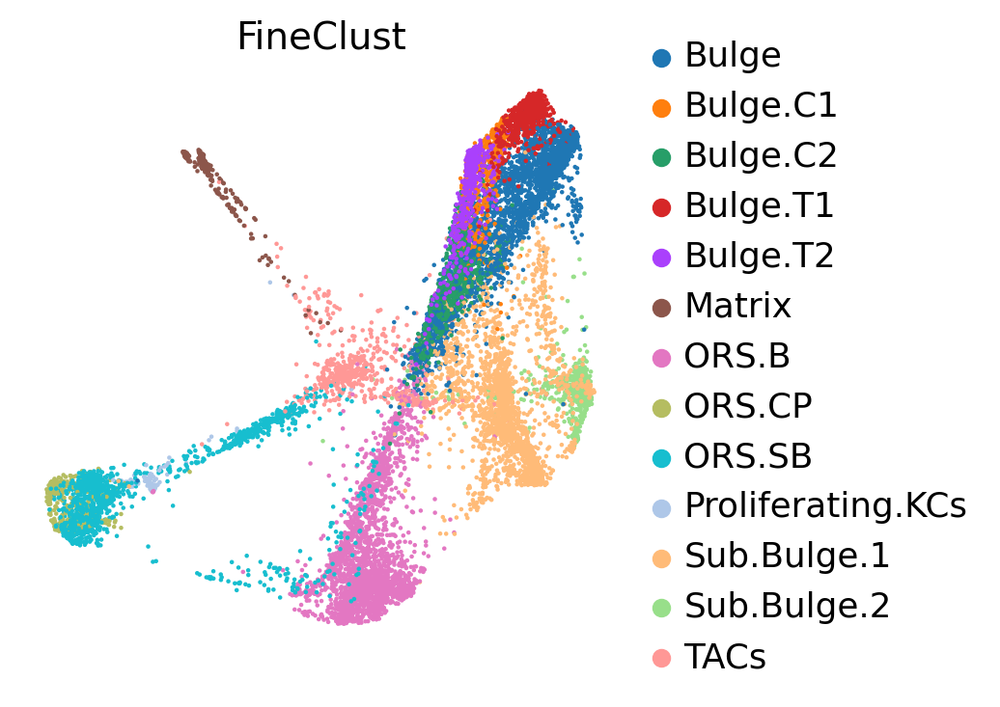

In [112]:
sc.pl.embedding(
    adata_subset,
    basis="X_draw_graph_fa",
    frameon=False,
    color = "FineClust"
)

In [88]:
imputed_X = palantir.utils.run_magic_imputation(adata_subset)

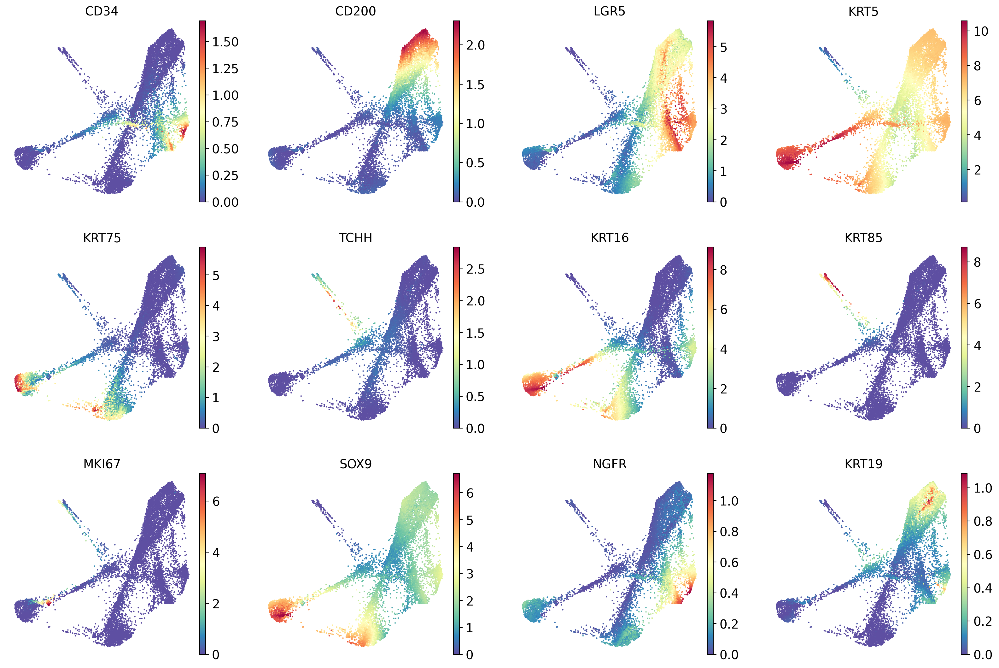

In [89]:
sc.pl.embedding(
    adata_subset,
    basis="draw_graph_fa",
    layer="MAGIC_imputed_data",
    color=["CD34", "CD200", "LGR5", "KRT5", "KRT75", "TCHH", "KRT16", "KRT85", "MKI67", "SOX9", "NGFR", "KRT19"],
    frameon=False,
)
plt.show()

In [247]:
sc.tl.diffmap(adata_subset)
adata_subset.obsm['X_diffmap'][:, 1].argmax()

8027

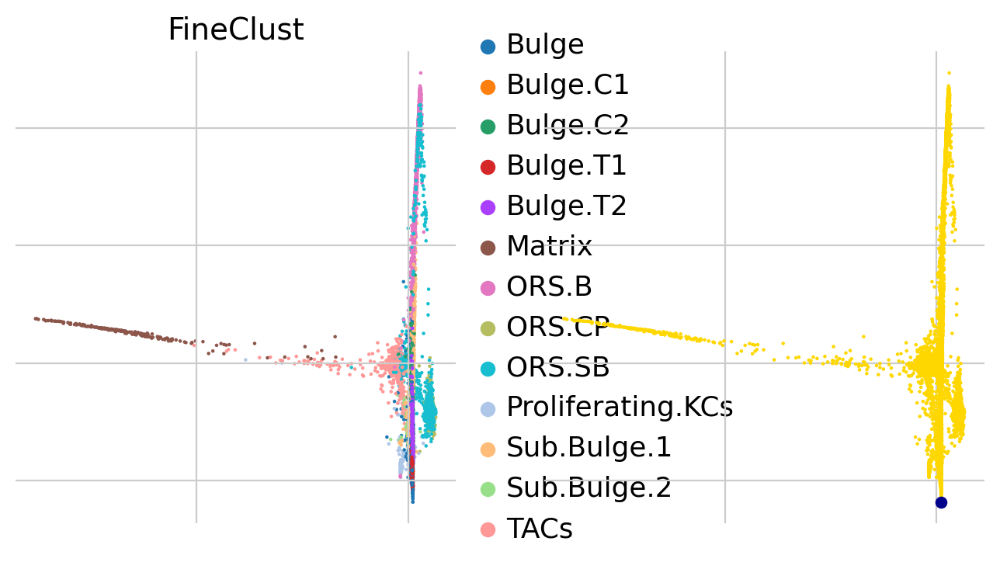

In [248]:
root_ixs = 8027

scv.pl.scatter(
    adata_subset,
    basis="diffmap",
    c=["FineClust", root_ixs],
    legend_loc="right",
    components=["2, 3"],
)

adata_subset.uns["iroot"] = root_ixs

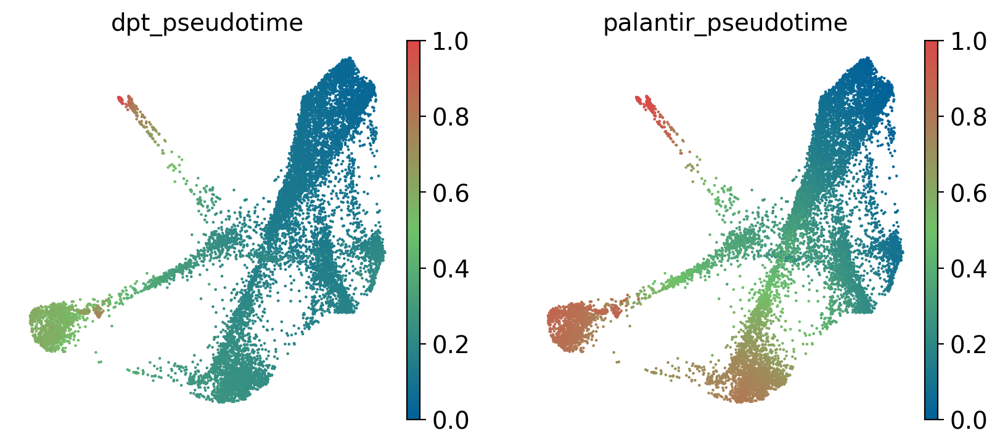

In [251]:
sc.tl.dpt(adata_subset)
sc.pl.embedding(
    adata_subset,
    basis="draw_graph_fa",
    color=["dpt_pseudotime", "palantir_pseudotime"],
    color_map= custom_cmap,
)

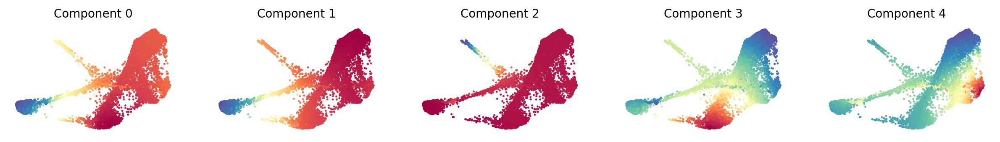

In [249]:
palantir.plot.plot_diffusion_components(adata_subset, embedding_basis = "X_draw_graph_fa")
plt.show()

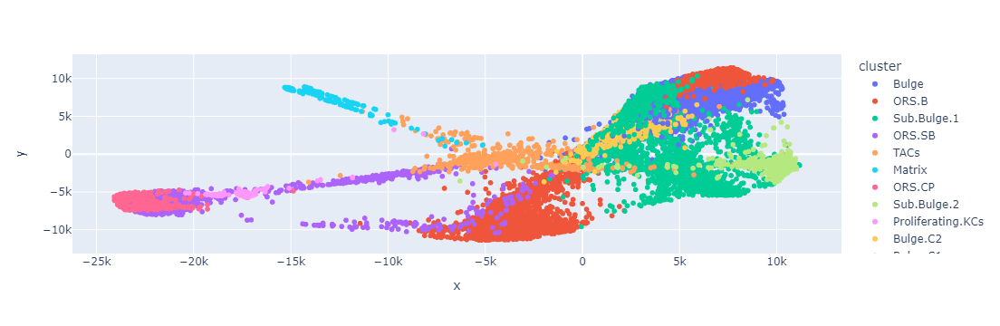

In [246]:
# Show interactive plot using plotly. Please make sure that plotly is installed.
try:
    import plotly.express as px
    import pandas as pd
    
    def plot(adata_subset, embedding_key, cluster_column_name):
        embedding = adata_subset.obsm[embedding_key]
        df = pd.DataFrame(embedding, columns=["x", "y"])
        df["cluster"] = adata_subset.obs[cluster_column_name].values
        df["label"] = adata_subset.obs.index.values
        fig = px.scatter(df, x="x", y="y", hover_name="label", color="cluster")
        fig.show()
    
    plot(adata_subset=adata_subset,
         embedding_key=embedding_key,
         cluster_column_name='FineClust')  # replace with your actual cluster column name
except ImportError:
    print("Plotly not found in your environment. Please install it with: pip install plotly")

In [97]:
start_cell = "Tel_ACCGAAAGTGGGTCAG-1"

terminal_states = pd.Series(
    ["Matrix", "ORS.CP", "ORS.SB", "ORS.B"],
    index=["Ana_GCCCACTTCTATGAAC-1", "Ana_CTCCTGATCGAGTGGA-1", "Ana_AATGCACCAGGAATCT-1", "Cat_ATGGCAAGTAATCCCG-1"],
)


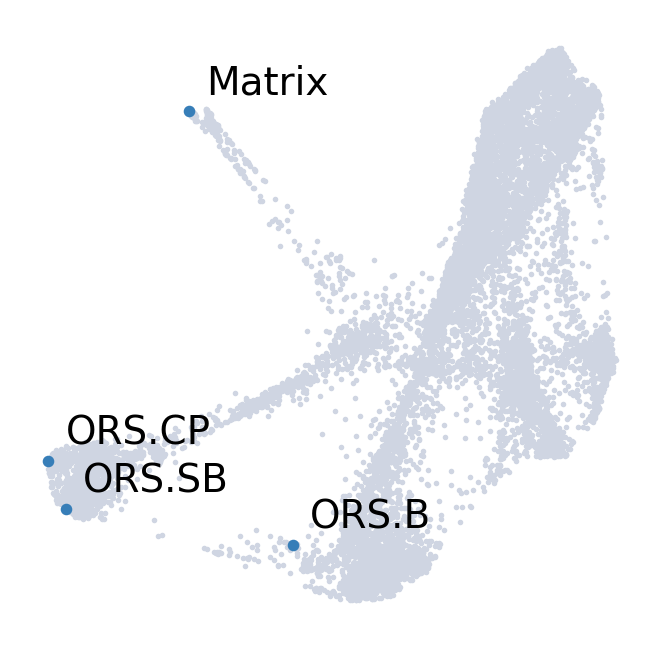

In [98]:
palantir.plot.highlight_cells_on_umap(adata_subset, terminal_states, embedding_basis = "X_draw_graph_fa")
plt.show()

In [99]:
pr_res = palantir.core.run_palantir(
    adata_subset, start_cell, num_waypoints=500, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.012682477633158365 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.3071058034896851 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


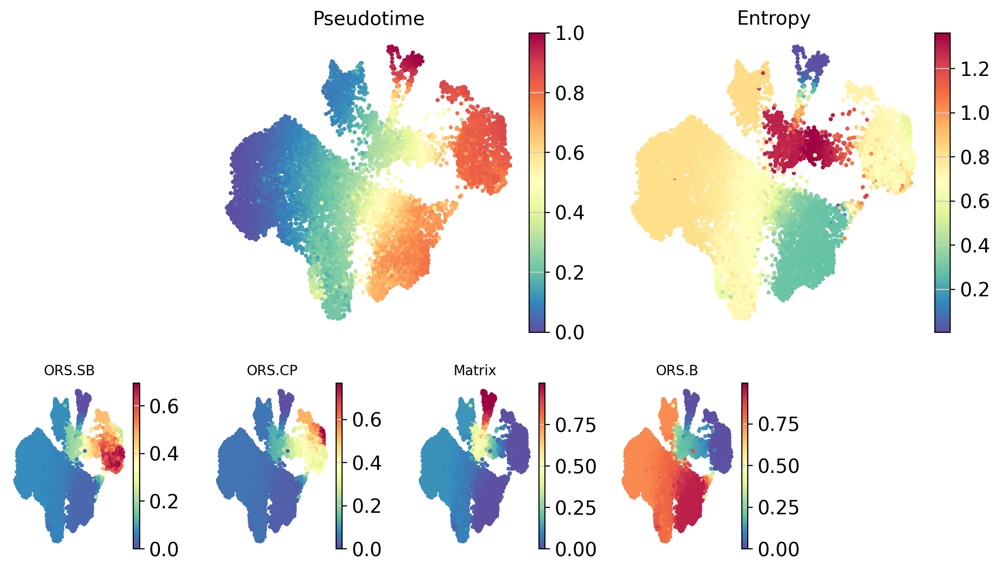

In [113]:
palantir.plot.plot_palantir_results(adata_subset, s=4)
plt.show()

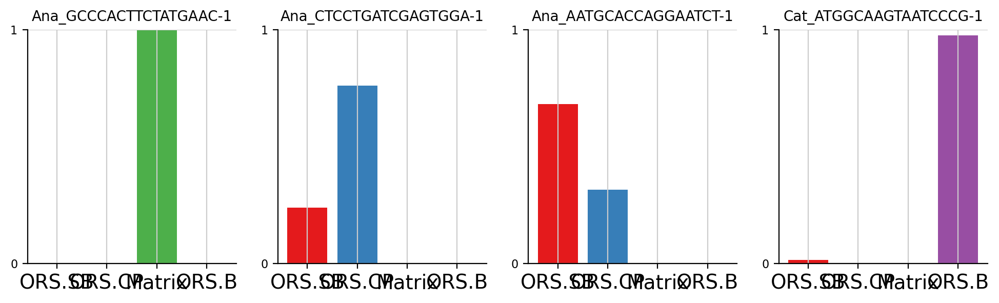

In [101]:
cells = ["Ana_GCCCACTTCTATGAAC-1", "Ana_CTCCTGATCGAGTGGA-1", "Ana_AATGCACCAGGAATCT-1", "Cat_ATGGCAAGTAATCCCG-1"]

palantir.plot.plot_terminal_state_probs(adata_subset, cells)
plt.show()

In [102]:
masks = palantir.presults.select_branch_cells(adata_subset, q=.01, eps=.01)

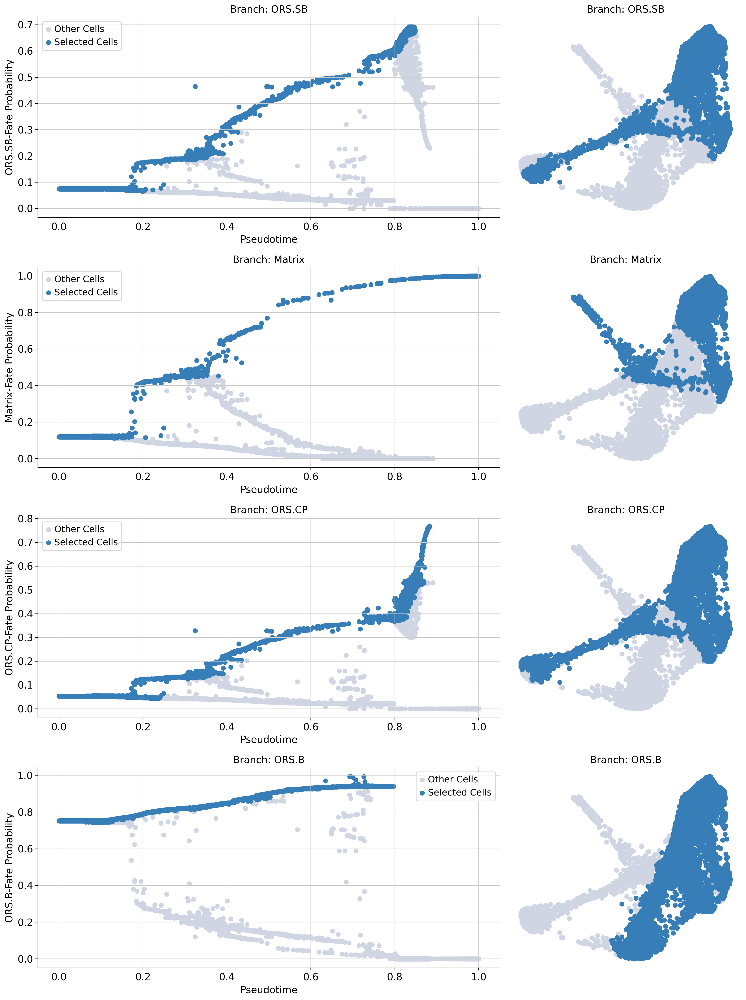

In [105]:
palantir.plot.plot_branch_selection(adata_subset, embedding_basis = "X_draw_graph_fa")
plt.show()

[2024-10-29 23:21:13,246] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (4,390) and rank = 1.0.
[2024-10-29 23:21:13,247] [INFO    ] Using covariance function Matern52(ls=1.245515727996826).
[2024-10-29 23:21:13,249] [INFO    ] Computing 50 landmarks with k-means clustering.


<Axes: title={'center': 'Branch: Matrix'}>

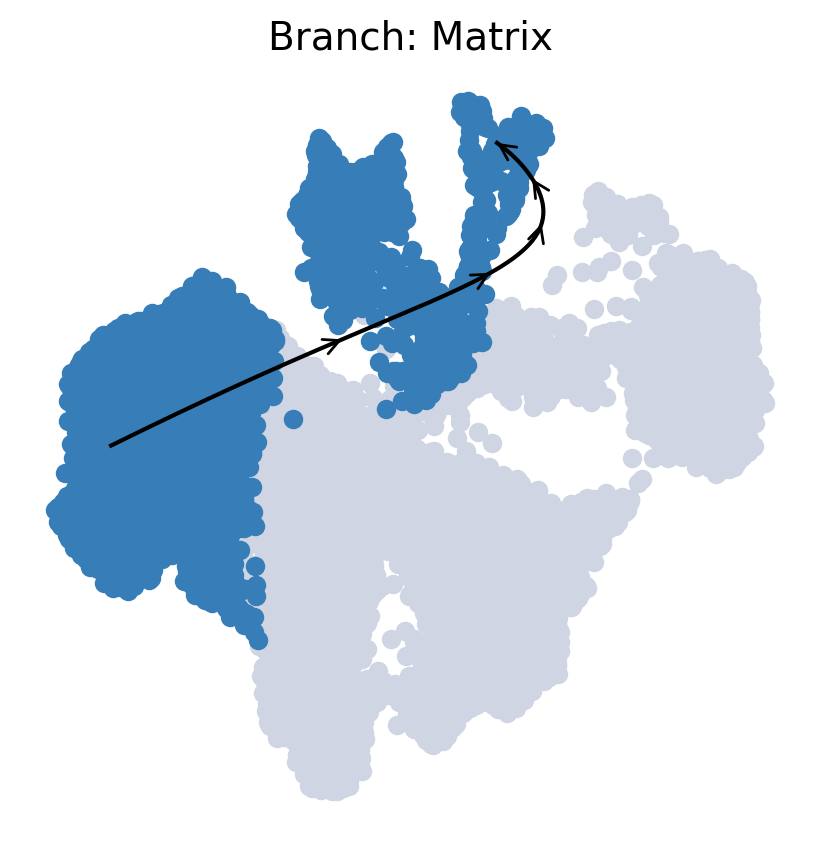

In [119]:
term_states = ["Matrix", "ORS.CP", "ORS.SB", "ORS.B"]

palantir.plot.plot_trajectory(adata_subset, "Matrix")


[2024-10-29 23:21:17,472] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (4,390) and rank = 1.0.
[2024-10-29 23:21:17,473] [INFO    ] Using covariance function Matern52(ls=1.245515727996826).
[2024-10-29 23:21:17,475] [INFO    ] Computing 50 landmarks with k-means clustering.


<Axes: title={'center': 'Branch: Matrix'}, xlabel='UMAP1', ylabel='UMAP2'>

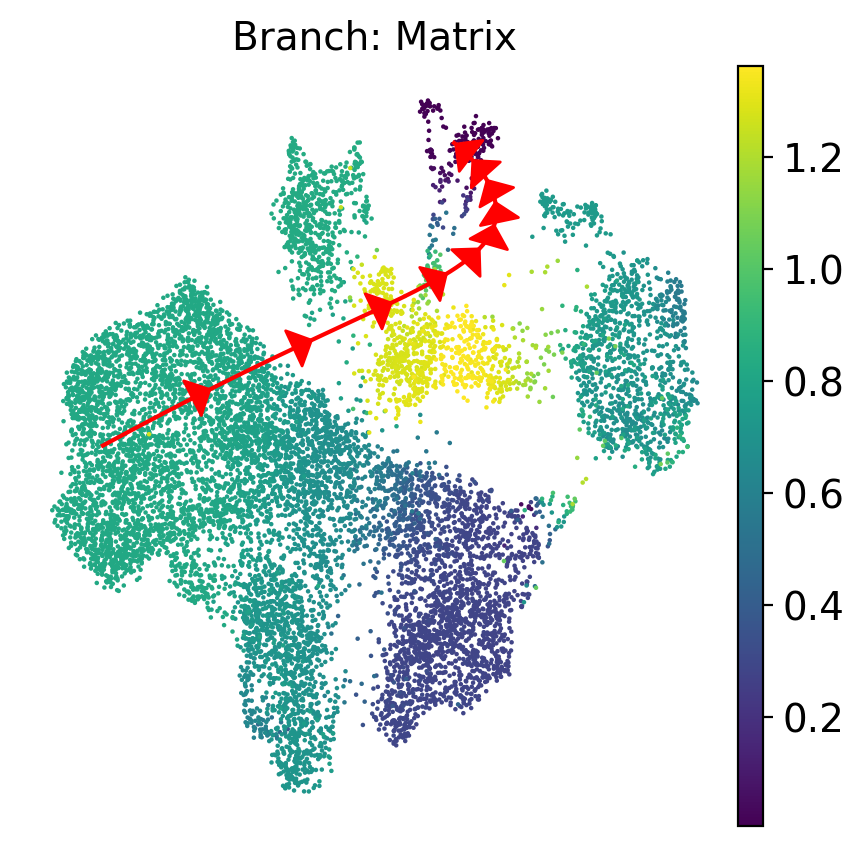

In [120]:
palantir.plot.plot_trajectory(
    adata_subset,
    "Matrix",
    cell_color="palantir_entropy",
    n_arrows=10,
    color="red",
    scanpy_kwargs=dict(cmap="viridis"),
    arrowprops=dict(arrowstyle="-|>,head_length=.5,head_width=.5"),
)

In [121]:
gene_trends = palantir.presults.compute_gene_trends(
    adata_subset,
    expression_key="MAGIC_imputed_data",
)

ORS.SB
[2024-10-29 23:21:57,293] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (6,113) and rank = 1.0.
[2024-10-29 23:21:57,294] [INFO    ] Using covariance function Matern52(ls=1.0).
ORS.CP
[2024-10-29 23:22:02,685] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (7,193) and rank = 1.0.
[2024-10-29 23:22:02,687] [INFO    ] Using covariance function Matern52(ls=1.0).
Matrix
[2024-10-29 23:22:06,553] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (4,390) and rank = 1.0.
[2024-10-29 23:22:06,555] [INFO    ] Using covariance function Matern52(ls=1.0).
ORS.B
[2024-10-29 23:22:12,442] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (8,966) and rank = 1.0.
[2024-10-29 23:22:12,443] [INFO    ] Using covariance function Matern52(ls=1.0).


In [128]:
matrix_genes = adata_subset.var_names[:5000]
communities = palantir.presults.cluster_gene_trends(adata_subset, "Matrix", matrix_genes)

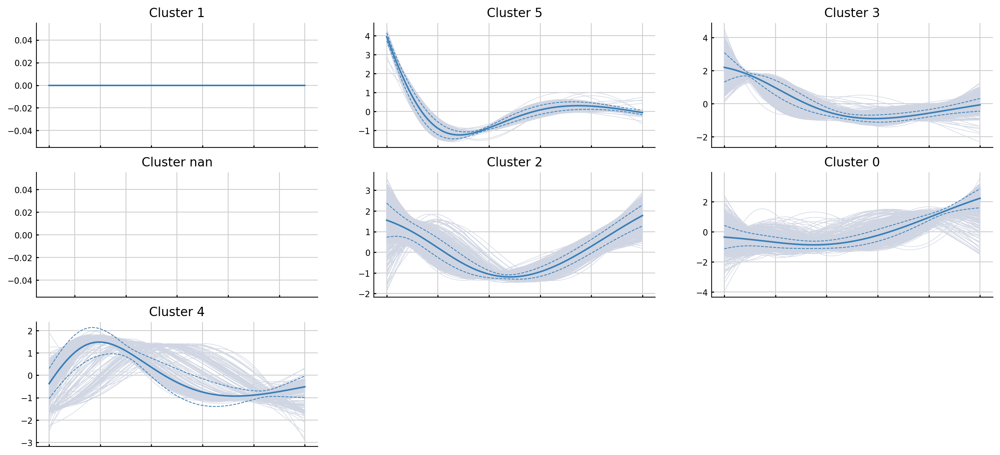

In [130]:
palantir.plot.plot_gene_trend_clusters(adata_subset, "Matrix")
plt.show()

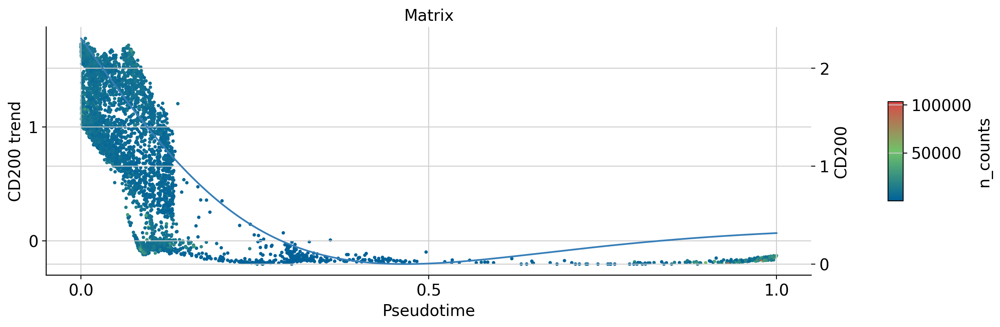

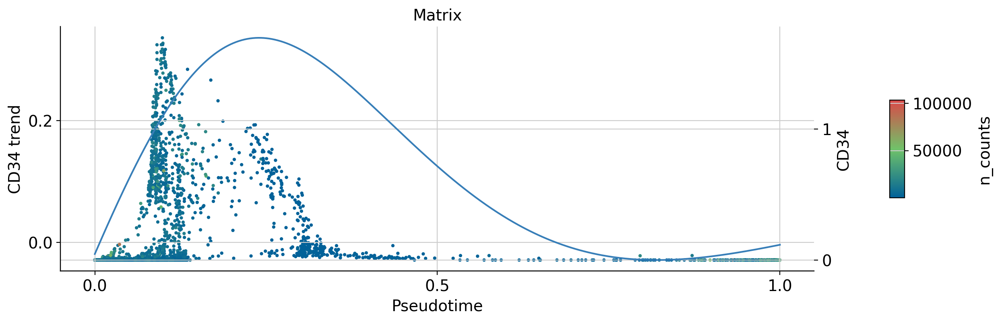

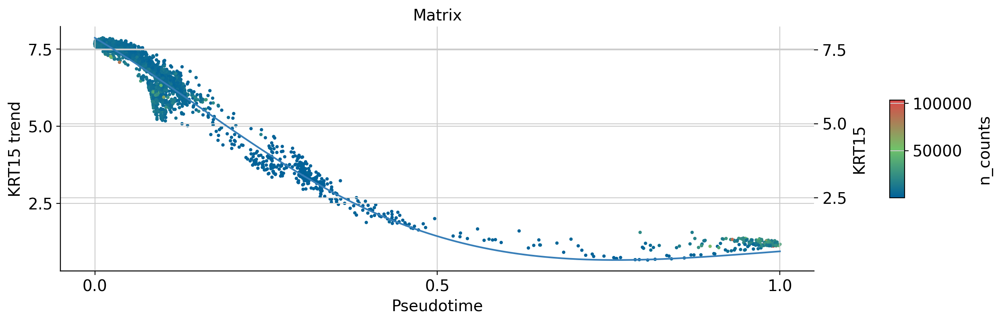

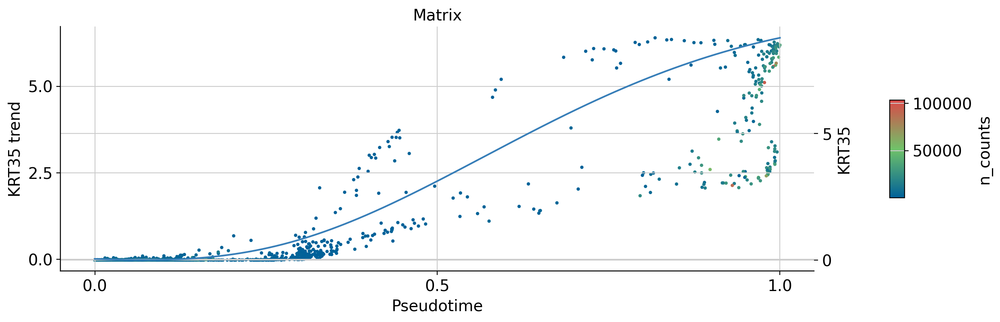

In [239]:
palantir.plot.plot_trend(adata_subset, "Matrix", "CD200", color="n_counts", position_layer="MAGIC_imputed_data", cmap = 'custom_btr')
palantir.plot.plot_trend(adata_subset, "Matrix", "CD34", color="n_counts", position_layer="MAGIC_imputed_data", cmap = 'custom_btr')
palantir.plot.plot_trend(adata_subset, "Matrix", "KRT15", color="n_counts", position_layer="MAGIC_imputed_data", cmap = 'custom_btr')
palantir.plot.plot_trend(adata_subset, "Matrix", "KRT35", color="n_counts", position_layer="MAGIC_imputed_data", cmap = 'custom_btr')
plt.show()